## Imports

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import warnings

warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", message=".*The 'nopython' keyword.*")

In [2]:
# necessary to update script changes without restarting the entire kernel
import importlib
import centroids

importlib.reload(centroids)
from centroids import compute_centroids, measure_distances, tsne_algorithms, tsne_clean, umap_algorithms, umap_clean

## Dataset

In [6]:
from keras.datasets import fashion_mnist

(X_train_full, y_train_full), (X_test_full, y_test_full) = fashion_mnist.load_data()

# train_images, _, train_labels, _ = train_test_split(X_train_full, y_train_full, train_size=0.1, random_state=42)
# test_images, _, test_labels, _ = train_test_split(X_test_full, y_test_full, train_size=0.1, random_state=42)
train_images=X_train_full
test_images=X_test_full
X_train = train_images.reshape(train_images.shape[0], -1)
X_test = test_images.reshape(test_images.shape[0], -1)
y_train=y_train_full
y_test=y_test_full

In [7]:
# print(train_images.shape)
# print(test_images.shape)
# X_train = train_images.reshape(train_images.shape[0], -1)
# X_test = test_images.reshape(test_images.shape[0], -1)
# print(X_train.shape)
# print(X_test.shape)
# y_train, y_test= train_labels, test_labels
# print(y_train.shape)
# print(y_test.shape)

(59400, 28, 28)
(9900, 28, 28)
(59400, 784)
(9900, 784)
(59400,)
(9900,)


In [ ]:
n_centroids=[100, 500, 1000]

Next we are going to use different clustering algorithms for calculating centroids. Centroids are stored in corresponding dictionares for each algorithm. Ine the beggining we awnted to use the created cluster labels thus we we store them in separate dictionaries, but as it stand for now we do not use them further in the project.

## Kmeans algorithm

Global centroids

In [ ]:
kmeans_global_centroids = {}
kmeans_global_labels = {}

for n in n_centroids:
    centroids, cluster_labels = compute_centroids(algorithm= "kmeans", method= "global", x_data= X_train, y_data= y_train, n_centroids_global= n)
    kmeans_global_centroids[n] = centroids
    kmeans_global_labels[n] = cluster_labels

Local centroids

In [ ]:
kmeans_local_centroids = {}
kmeans_local_labels = {}

for n in n_centroids:
    centroids, cluster_labels = compute_centroids(algorithm= "kmeans", method= "local", x_data= X_train, y_data= y_train, n_centroids_local= n/10)
    kmeans_local_centroids[n/10] = centroids
    kmeans_local_labels[n/10] = cluster_labels

## Agglomerative clustering algorithm

Global centroids

In [ ]:
agglomerative_global_centroids = {}
agglomerative_global_labels = {}

for n in n_centroids:
    centroids, cluster_labels = compute_centroids(algorithm= "agglomerative", method= "global", x_data= X_train, y_data= y_train, n_centroids_global= n)
    agglomerative_global_centroids[n] = centroids
    agglomerative_global_labels[n] = cluster_labels

Local centroids

In [ ]:
agglomerative_local_centroids = {}
agglomerative_local_labels = {}

for n in n_centroids:
    centroids, cluster_labels = compute_centroids(algorithm= "agglomerative", method= "local", x_data= X_train, y_data= y_train, n_centroids_local= n/10)
    agglomerative_local_centroids[n/10] = centroids
    agglomerative_local_labels[n/10] = cluster_labels

## DBSCAN algorithm

Global centroids

In [ ]:
# trzeba poszukac odpowiednich parametrow
dbscan_global_centroids, dbscan_global_labels=compute_centroids(algorithm= "dbscan", method= "global", x_data= X_train, y_data= y_train, epsilon=1100, min_samples=40)

In [ ]:
print(dbscan_global_centroids)

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.01618497 0.01849711 0.01965318 ... 0.26936416 0.06589595 0.0150289 ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.08955224 ... 0.01492537 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


In [ ]:
print(dbscan_global_centroids.shape)

(6, 784)


Local centroids

In [ ]:
# trzeba poszukac odpowiednich parametrow
dbscan_local_centroids, dbscan_local_labels=compute_centroids(algorithm="dbscan", method= "local", x_data= X_train, y_data= y_train, epsilon=1100, min_samples=40)

In [ ]:
print(dbscan_local_centroids)

[[0.         0.00847458 0.02542373 ... 0.01694915 0.         0.        ]
 [0.         0.         0.09230769 ... 0.01538462 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.1372549  0.12745098 0.12745098 ... 0.28431373 0.11764706 0.11764706]
 [0.         0.         0.         ... 0.         0.         0.        ]]


In [ ]:
print(dbscan_local_centroids.shape)

(5, 784)


## Jarvis-Patrick clustering algorithm

Global centroids

In [ ]:
jp_global_centroids = {}
jp_global_labels = {}

# for kmin_ in range(100):
#     for k_ in range(kmin_, 120):
#         centroids, cluster_labels = compute_centroids("jp", "global", X_train, y_train, 0, 0, 0, 0, k_, kmin_)
#         if len(centroids) > 8 and len(centroids)<12:
#             print(centroids.shape)
#             print(kmin_)
#             print(k_)

centroids, cluster_labels = compute_centroids(algorithm="jp", method="global", x_data=X_train, y_data=y_train, k=200, kmin=50)
print(centroids.shape)
print(centroids)
print(cluster_labels)

jp_global_centroids=centroids

(45, 784)
[[2.71094544e-03 6.43849543e-03 3.15147408e-02 ... 2.82124703e+00
  8.22771942e-01 5.43883429e-02]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.00000000e+00
  2.70833333e-01 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.00000000e+00
  0.00000000e+00 0.00000000e+00]]
[0 1 2 ... 0 None 0]


Local centroids

In [ ]:
centroids, cluster_labels = compute_centroids(algorithm="jp", method="local", x_data=X_train, y_data=y_train, k=200, kmin=50)
print(centroids.shape)
print(centroids)
print(cluster_labels)

jp_local_centroids=centroids

(45, 784)
[[0.00000000e+00 1.55979203e-02 1.23050260e-01 ... 3.62218371e-01
  8.66551127e-03 0.00000000e+00]
 [0.00000000e+00 6.77966102e-03 9.15254237e-02 ... 2.71186441e-02
  3.38983051e-03 0.00000000e+00]
 [0.00000000e+00 8.13008130e-03 2.43902439e-02 ... 9.51219512e-01
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.82736156e+00
  3.07328990e+00 1.72638436e-01]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]
[0 1 2 ... 0 0 0]


In [ ]:
# jp_local_centroids = {}
# jp_local_labels = {}

# for n in n_centroids:
#     centroids, cluster_labels = compute_centroids("jp", "local", X_train, y_train, int(n/10), 0)
#     jp_local_centroids[int(n/10)] = centroids
#     jp_local_labels[int(n/10)] = cluster_labels

In [ ]:
# Nie działa
# Docelowo to powinno byc w centroids.py ale tutaj latwiej jest znalezc blad

# import jarvispatrick

# def euclidean_distance(point1, point2):
#     return np.linalg.norm(point1 - point2)

# def global_jp(x_data):
#     cluster_gen = jarvispatrick.JarvisPatrick(x_data, euclidean_distance)
#     cluster = cluster_gen( 4, 2 )
#     print(cluster)

# global_jp(X_train)


# import numpy as np

# def euclidean_distance(point1, point2):
#     return np.linalg.norm(np.array(point1) - np.array(point2))

# X_train_tuples = [tuple(point) for point in X_test]
# dataset_elements = [tuple(point) for point in X_train_tuples]

# cluster_generator = jarvispatrick.JarvisPatrick(dataset_elements, euclidean_distance)
# clusters = cluster_generator(4, 2)



In [ ]:
# clusters

# # cluster_generator.cluster
# # clusters_array = np.array(list(clusters.values()))
# # cluster_array = clusters_array.reshape(clusters_array.shape[0], clusters_array.shape[2])

# # cluster_array.shape

## Distances

In [ ]:
kmeans_global_distances={}
kmeans_local_distances={}
agglomerative_global_distances={}
agglomerative_local_distances={}

for n in n_centroids:
    kmeans_global_distances[n] = measure_distances(x_data= X_test, centroids= kmeans_global_centroids[n], algorithm= "kmeans", method= "global", metric= "euclidean")
    kmeans_local_distances[n/10] = measure_distances(x_data= X_test, centroids= kmeans_local_centroids[n/10], algorithm= "kmeans", method= "local", metric= "euclidean")
    agglomerative_global_distances[n] = measure_distances(x_data= X_test, centroids= agglomerative_global_centroids[n], algorithm= "agglomerative", method= "global", metric= "euclidean")
    agglomerative_local_distances[n/10] = measure_distances(x_data= X_test, centroids= agglomerative_local_centroids[n/10], algorithm= "agglomerative", method= "local", metric= "euclidean")
    
dbscan_global_distances = measure_distances(x_data= X_test, centroids= dbscan_global_centroids, algorithm= "dbscan", method= "global", metric= "euclidean")
dbscan_local_distances = measure_distances(x_data= X_test, centroids= dbscan_local_centroids, algorithm= "dbscan", method= "local", metric= "euclidean")

jp_global_distances = measure_distances(x_data= X_test, centroids= jp_global_centroids, algorithm= "jp", method= "global", metric= "euclidean")
jp_local_distances = measure_distances(x_data= X_test, centroids= jp_local_centroids, algorithm= "jp", method= "local", metric= "euclidean")

In [ ]:
print(kmeans_global_distances[100].shape)
print(kmeans_local_distances[10].shape)
print(agglomerative_global_distances[100].shape)
print(agglomerative_local_distances[10].shape)
print(dbscan_global_distances.shape)
print(dbscan_local_distances.shape)

print(jp_global_distances.shape)
print(jp_local_distances.shape)

(1000, 100)
(1000, 100)
(1000, 100)
(1000, 100)
(1000, 6)
(1000, 5)
(1000, 45)
(1000, 45)


## Visualization with UMAP

Kmeans

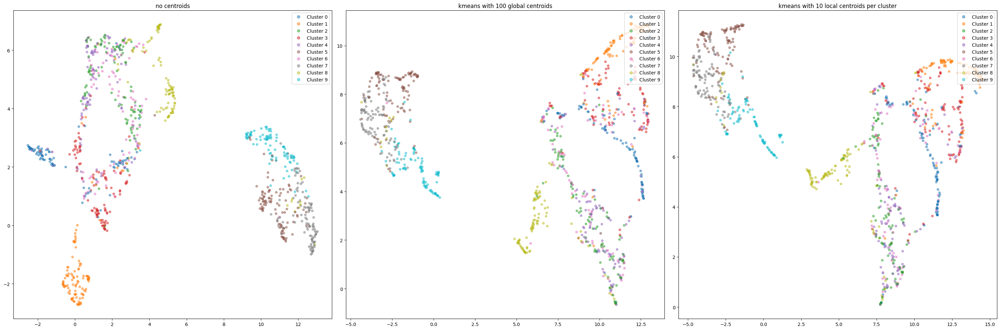

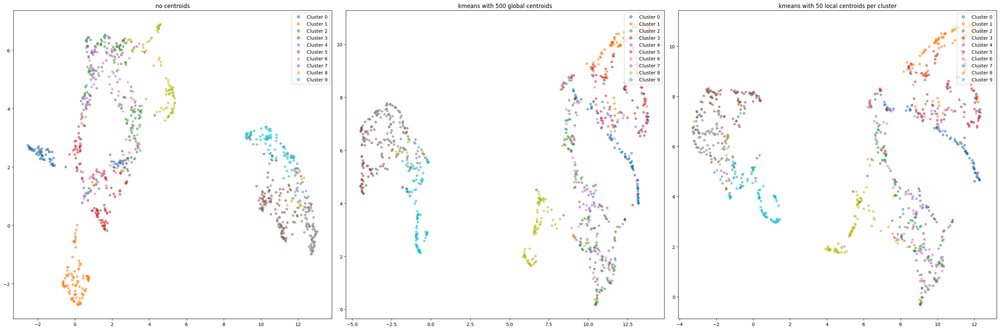

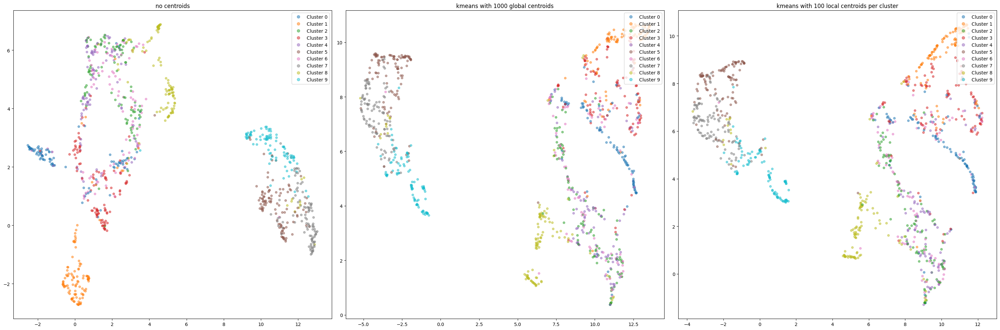

In [ ]:
for n in n_centroids:
    fig, axs = plt.subplots(1, 3, figsize=(30, 10))
    umap_clean(x_data= X_test, y_data= y_test, algorithm= "kmeans", ax= axs[0])
    umap_algorithms(x_data= kmeans_global_distances[n], y_data= y_test, algorithm= "kmeans", method= "global", ax= axs[1])
    umap_algorithms(x_data= kmeans_local_distances[n/10], y_data= y_test, algorithm= "kmeans", method= "local", ax= axs[2])
    
    plt.tight_layout()
    plt.show()

Agglomerative clustering

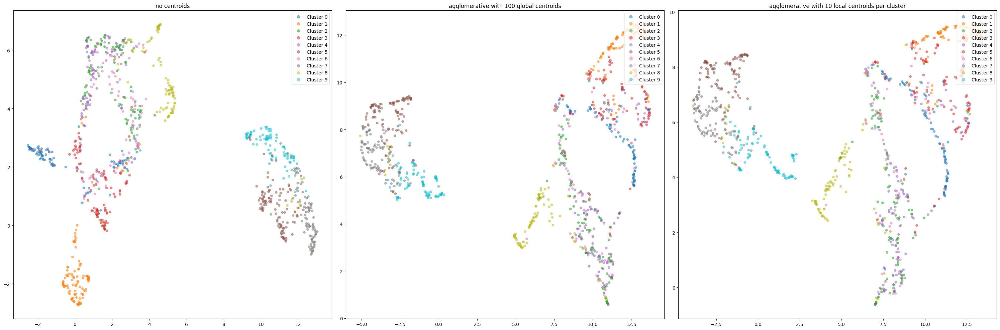

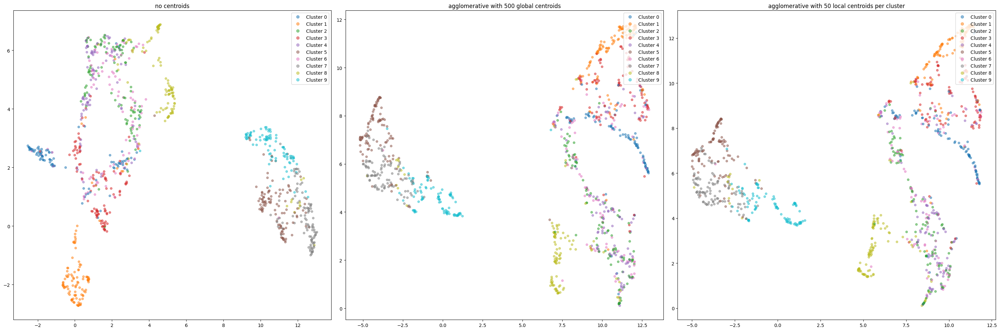

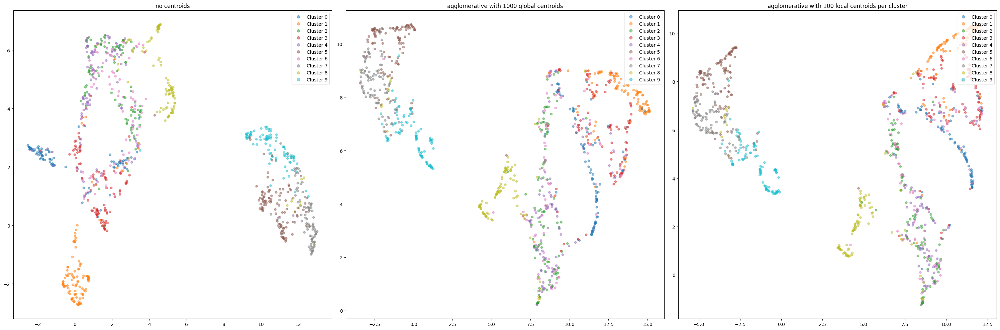

In [ ]:
for n in n_centroids:
    fig, axs = plt.subplots(1, 3, figsize=(30, 10))
    umap_clean(x_data= X_test, y_data= y_test, algorithm= "agglomerative", ax= axs[0])
    umap_algorithms(x_data= agglomerative_global_distances[n], y_data= y_test, algorithm= "agglomerative", method= "global", ax= axs[1])
    umap_algorithms(x_data= agglomerative_local_distances[n/10], y_data= y_test, algorithm= "agglomerative", method= "local", ax= axs[2])
    
    plt.tight_layout()
    plt.show()

DBSCAN

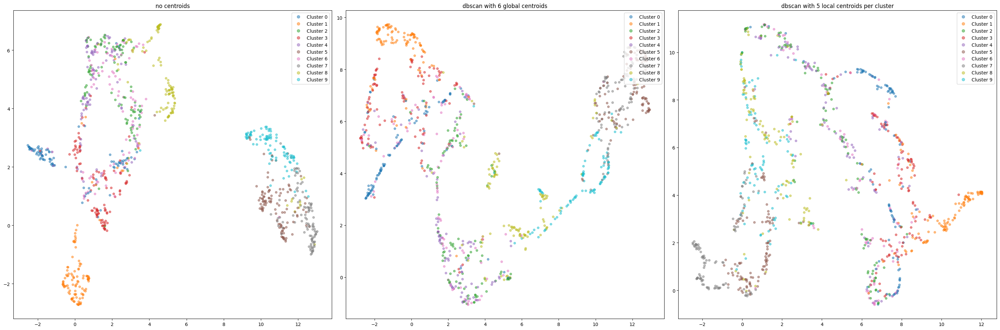

In [ ]:
fig, axs = plt.subplots(1, 3, figsize=(30, 10))
umap_clean(x_data= X_test, y_data= y_test, algorithm= "dbscan", ax= axs[0])
umap_algorithms(x_data= dbscan_global_distances, y_data= y_test, algorithm= "dbscan", method= "global", ax= axs[1])
umap_algorithms(x_data= dbscan_local_distances, y_data= y_test, algorithm= "dbscan", method= "local", ax= axs[2])    

plt.tight_layout()
plt.show()

Jarvis-Patrick

In [ ]:
# fig, axs = plt.subplots(1, 3, figsize=(30, 10))
# umap_clean(X_test, y_test, "jp", axs[0])
# umap_algorithms(jp_global_distances, y_test, "jp", "global", 15, axs[1])
# umap_algorithms(jp_local_distances, y_test, "jp", "local", 14/10, axs[2])    

# plt.tight_layout()
# plt.show()

# fig, axs = plt.subplots(1, 3, figsize=(30, 10))
# umap_clean(X_test, y_test, "jp", axs[0])
# umap_algorithms(jp_global_distances, y_test, "jp", "global", 30, axs[1])
# umap_algorithms(jp_local_distances, y_test, "jp", "local", 27/10, axs[2])    

# plt.tight_layout()
# plt.show()

# fig, axs = plt.subplots(1, 3, figsize=(30, 10))
# umap_clean(X_test, y_test, "jp", axs[0])
# umap_algorithms(jp_global_distances, y_test, "jp", "global", 45, axs[1])
# umap_algorithms(jp_local_distances, y_test, "jp", "local", 45/10, axs[2])    

# plt.tight_layout()
# plt.show()

## Visualization with t-SNE

Kmeans

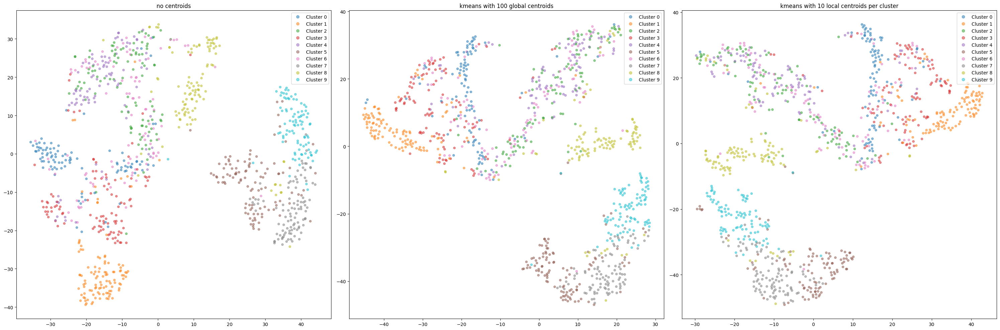

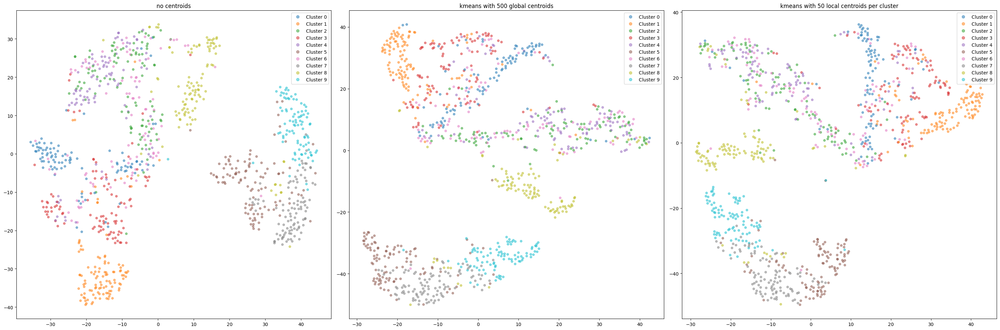

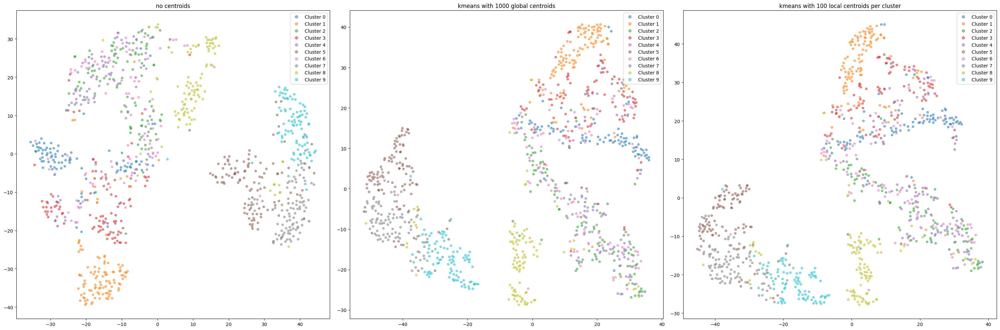

In [ ]:
for n in n_centroids:
    fig, axs = plt.subplots(1, 3, figsize=(30, 10))
    tsne_clean(x_data= X_test, y_data= y_test, algorithm= "kmeans", ax= axs[0])
    tsne_algorithms(x_data= kmeans_global_distances[n], y_data= y_test, algorithm= "kmeans", method= "global", ax= axs[1])
    tsne_algorithms(x_data= kmeans_local_distances[n/10], y_data= y_test, algorithm= "kmeans", method= "local", ax= axs[2])

    plt.tight_layout()
    plt.show()

Agglomerative clustering

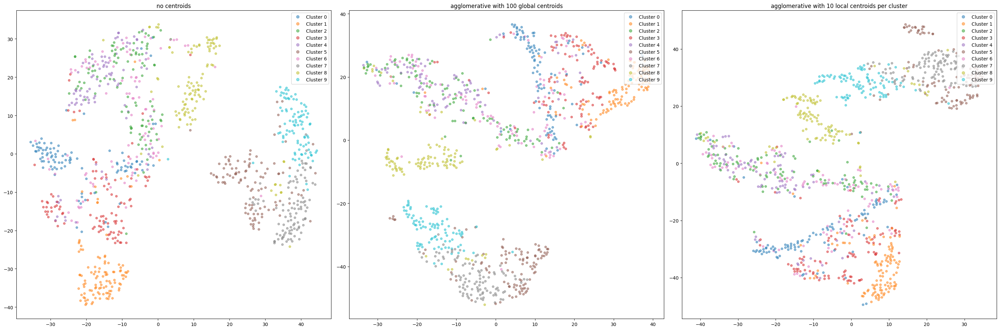

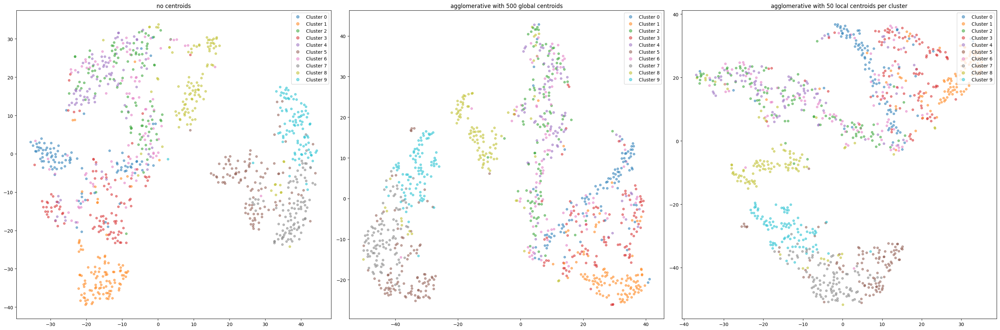

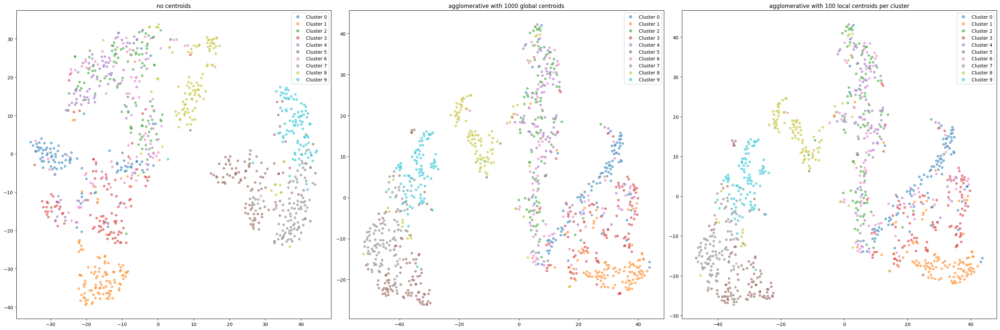

In [ ]:
for n in n_centroids:
    fig, axs = plt.subplots(1, 3, figsize=(30, 10))
    tsne_clean(x_data= X_test, y_data= y_test, algorithm= "agglomerative", ax= axs[0])
    tsne_algorithms(x_data= agglomerative_global_distances[n], y_data= y_test, algorithm= "agglomerative", method= "global", ax= axs[1])
    tsne_algorithms(x_data= agglomerative_local_distances[n/10], y_data= y_test, algorithm= "agglomerative", method= "local", ax= axs[2])
    
    plt.tight_layout()
    plt.show()

DBSCAN

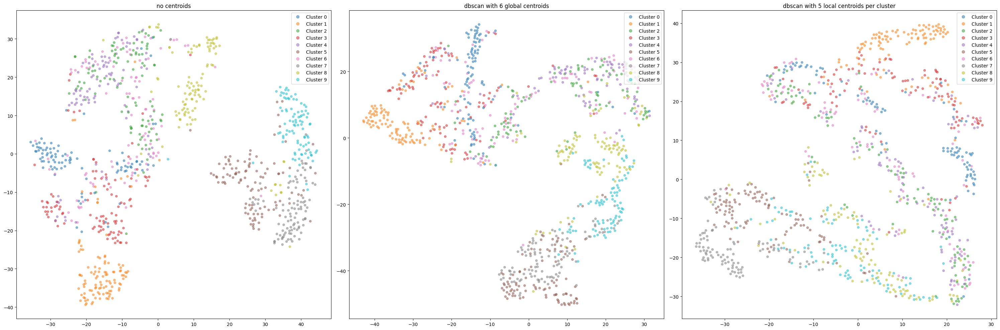

In [ ]:
fig, axs = plt.subplots(1, 3, figsize=(30, 10))
tsne_clean(x_data= X_test, y_data= y_test, algorithm= "dbscan", ax= axs[0])
tsne_algorithms(x_data= dbscan_global_distances, y_data= y_test, algorithm= "dbscan", method= "global", ax= axs[1])
tsne_algorithms(x_data= dbscan_local_distances, y_data= y_test, algorithm= "dbscan", method= "local", ax= axs[2])    

plt.tight_layout()
plt.show()

Jarvis-Patrick